In [249]:
from collections import defaultdict  # Importing Libraries

import math
import numpy as np
import random
import copy

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.animation import FuncAnimation

from IPython.display import HTML

import qwerty_layout as qwerty

from typing import List
from typing import Dict
from typing import Tuple

qwrty = {}
qwrty[
    "keys"
] = (
    qwerty.keys
)  # Converting the module object into a dictionary (module object cant be changed dynamically)
qwrty["characters"] = qwerty.characters

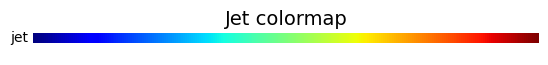

In [250]:
import pylab

cm = pylab.get_cmap("jet")  # The colormap I have used for this assignment

cmaps = {}
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))


def plot_color_gradient(
    category: str, cmap_list: List[str]
) -> None:  # To show the colormap
    figh = 0.72
    fig, axs = plt.subplots(nrows=2, figsize=(6.4, figh))
    fig.subplots_adjust(top=1 - 0.35 / figh, bottom=0.15 / figh, left=0.2, right=0.99)
    axs[0].set_title(f"{category} colormap", fontsize=14)

    for ax, name in zip(axs, cmap_list):
        ax.imshow(gradient, aspect="auto", cmap=mpl.colormaps[name])
        ax.text(
            -0.01,
            0.5,
            name,
            va="center",
            ha="right",
            fontsize=10,
            transform=ax.transAxes,
        )

    for ax in axs:
        ax.set_axis_off()


plot_color_gradient(
    "Jet",
    [
        "jet",
    ],
)

In [251]:
class kybd_optimise:  # Used a class for all the operations
    def __init__(self, layout=qwrty):
        self.init_layout = (
            layout  # The layout I work with initially (provided by the user)
        )
        self.cur_layout = (
            layout  # Current layout I am working with (after some optimization)
        )

        self.travel = (
            self.key_dist()
        )  # Dictionary which stores the distance travelled by fingers to type each key (Stores it for the current layout)
        self.init_travel = (
            self.key_dist()
        )  # Dictionary which stores the distance travelled by fingers to type each key (To store travel distances of initial layout)
        self.freq = defaultdict(
            int
        )  # Dictionary which stores the stores the frequencies of each key pressed
        self.let_rank = (
            []
        )  # List which ranks the usage of each letter and is used while assinging colour

    def euc_dist(
        self, key1: tuple[float, float], key2: tuple[float, float]
    ) -> (
        float
    ):  # Method to get the distance between two keys (needed for computing travel distance)
        return math.sqrt((key2[1] - key1[1]) ** 2 + (key2[0] - key1[0]) ** 2)

    def key_dist(self) -> Dict[str, float]:  # To map each key to a distance
        di = {}

        for i in self.init_layout["keys"]:
            parent = self.init_layout["keys"][i]["start"]
            di[i] = self.euc_dist(
                self.init_layout["keys"][i]["pos"],
                self.init_layout["keys"][parent]["pos"],
            )

        return di

    def travel_dist(
        self, seq: str, input_lay_map
    ) -> (
        float
    ):  # Method to compute the travel distance for the current layout (This is my cost function)
        trav = 0
        self.freq = defaultdict(int)

        for s in seq:
            if s == " ":
                continue
            for p in self.init_layout["characters"][s]:
                trav += input_lay_map[p]
                self.freq[p] += 1

        self.let_rank = list(set(self.freq.values()))
        self.let_rank.sort()

        return trav

    def gen_layout(
        self,
    ):  # To generate a neighbour layout (current layout with two keys swapped)
        new_layout = copy.deepcopy(self.cur_layout)

        while True:
            i, j = random.sample(
                list(self.cur_layout["keys"].keys()), 2
            )  # Choosing any 2 random keys
            if (
                i == "Space" or j == "Space"
            ):  # I am not taking space into consideration since I had avodied it while computing distance
                continue

            elif i[:5] == "Shift" or j[:5] == "Shift":
                if (6.3 - self.cur_layout["keys"][i]["pos"][0]) * (
                    6.3 - self.cur_layout["keys"][j]["pos"][0]
                ) < 0:  # I dont want Shift_L/R to go to the other side of the keyboard
                    continue
                else:
                    break

            else:
                break

        self.travel[i], self.travel[j] = (
            self.travel[j],
            self.travel[i],
        )  # Swapping the position and travel distance of both the keys
        new_layout["keys"][i]["pos"], new_layout["keys"][j]["pos"] = (
            new_layout["keys"][j]["pos"],
            new_layout["keys"][i]["pos"],
        )

        return new_layout, i, j

    def sim_anneal(
        self, seq: str, initial_temp: float, cooling_rate: float, num_iterations: int
    ):  # Simulated Annealing
        current_distance = self.travel_dist(
            seq, self.init_travel
        )  # Current Travel Distance
        best_distance = current_distance  # To store the best travel distance
        good_kyb = self.init_layout  # To store the current layout

        temp = initial_temp
        self.distances = [current_distance]
        self.best_layouts = [copy.deepcopy(good_kyb)]
        self.best_distances = [best_distance]

        for i in range(num_iterations):
            temp_layout, key1, key2 = self.gen_layout()
            temp_distance = self.travel_dist(seq, self.travel)

            p = np.exp(
                (current_distance - temp_distance) / temp
            )  # Our probability function

            if (
                temp_distance < current_distance or random.random() < p
            ):  # Either Our Layout is better or we choose from the virtual coin toss
                self.cur_layout = temp_layout
                current_distance = temp_distance

                if current_distance < best_distance:
                    good_kyb = copy.deepcopy(self.cur_layout)
                    best_distance = current_distance

            else:  # Swapping the keys back to where they were since we haven't chosen this layout
                self.travel[key1], self.travel[key2] = (
                    self.travel[key2],
                    self.travel[key1],
                )

            temp *= (
                cooling_rate  # changing the temperature by a factor of the cooling rate
            )
            self.distances.append(current_distance)  # Storing this distance
            self.best_layouts.append(copy.deepcopy(good_kyb))  # Storing the best layout
            self.best_distances.append(best_distance)  # Storing the best distance

        print(f"initial travel distance was {self.distances[0]}")
        print(
            f"After simulated annealing, minimum travel distance is {self.best_distances[-1]}"
        )
        print(
            f"There has been a {(( self.distances[0]-self.best_distances[-1])*100)/ self.distances[0]}% improvement"
        )

        return self.best_layouts[-1]

    def kybd_image(
        self, layout1, layout2
    ) -> None:  # Method To show the comparision of the two 2 keyboards
        self.fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 5))

        ax1.set_xticks([])
        ax1.set_yticks([])
        ax1.set_xlim(-1, 14.75)
        ax1.set_ylim(-1, 5)
        ax1.set_title("Initial Layout")

        ax2.set_xticks([])
        ax2.set_yticks([])
        ax2.set_xlim(15.5, 31)
        ax2.set_ylim(-1, 5)
        ax2.set_title("Optimized Layout")

        plt.tight_layout()

        for key in layout1["keys"]:
            if key == "Space":  # Skews distribution so left it as gray
                color = (0.3, 0.3, 0.3)
            elif self.freq[key] == 0:  # key was never pressed
                color = cm(1.0 * 0)
            else:  # Assigning a colour to the key based on the relative frequency
                color = cm(1.0 * ((self.freq[key] / self.let_rank[-1])))

            key_loc1 = layout1["keys"][key]["pos"]  # For the initial layout
            rect = Rectangle(
                key_loc1, 0.75, 0.75, facecolor=color, alpha=0.9, edgecolor="black"
            )
            ax1.text(
                key_loc1[0] + 0.375,
                key_loc1[1] + 0.375,
                key,
                horizontalalignment="center",
                verticalalignment="center",
            )
            ax1.add_patch(rect)

            key_loc2 = layout2["keys"][key]["pos"]  # For our optimised layout
            key_loc2_shifted = (
                key_loc2[0] + 16,
                key_loc2[1],
            )  # Offsetting it to the right
            rect = Rectangle(
                key_loc2_shifted,
                0.75,
                0.75,
                facecolor=color,
                alpha=0.9,
                edgecolor="black",
            )
            ax2.text(
                key_loc2[0] + 16.375,
                key_loc2[1] + 0.375,
                key,
                horizontalalignment="center",
                verticalalignment="center",
            )
            ax2.add_patch(rect)

        plt.show()

    def visualise_kyb(
        self, num_iterations: int
    ):  # Method to show the animation of simulation annealing
        self.fig, (self.ax1, self.ax2) = plt.subplots(1, 2, figsize=(30, 6))

        self.ax1.set_xticks([])
        self.ax1.set_yticks([])
        self.ax1.set_xlim(-1, 15)
        self.ax1.set_ylim(-1, 5)
        self.ax1.set_title("Keyboard Visualisation")

        self.ax2.set_xlim(0, num_iterations)
        self.ax2.set_ylim(min(self.distances) * 0.9, max(self.distances) * 1.1)
        self.ax2.set_title("Best Distance over Iterations")
        self.ax2.set_xlabel("Iteration")
        self.ax2.set_ylabel("Distance")

        (distance_line,) = self.ax2.plot(
            [], [], "r-"
        )  # Least Travel Distance found so far
        (cur_dist_line,) = self.ax2.plot(
            [], [], "g-"
        )  # Travel Distance of the Current Layout

        plt.tight_layout()

        anim = FuncAnimation(
            self.fig,
            self.update,
            frames=range(0, num_iterations, 1),
            fargs=(
                self.best_layouts,
                self.best_distances,
                self.distances,
                distance_line,
                cur_dist_line,
            ),
            interval=50,
            blit=True,
            repeat=False,
        )

        return anim

    def update(
        self,
        frame: int,
        layouts,
        distances: List[float],
        cur_dist: List[float],
        distance_line,
        cur_dist_line,
    ):  # Method used for the anim function
        layout = layouts[frame]
        distance_line.set_data(range(frame + 1), distances[: frame + 1])
        cur_dist_line.set_data(range(frame + 1), cur_dist[: frame + 1])

        self.ax1.clear()
        self.ax1.set_title("Keyboard Visualisation")
        self.ax1.set_xlim(
            -1, 15
        )  # Removing axis points (1,2,3.. on x axis wont show up)
        self.ax1.set_ylim(-1, 5)

        self.ax1.set_xticks([])
        self.ax1.set_yticks([])

        for key in layout["keys"]:
            key_loc = layout["keys"][key]["pos"]

            if key == "Space":  # Skews distribution so left it as gray
                rect = Rectangle(
                    key_loc,
                    0.75,
                    0.75,
                    facecolor=(0.3, 0.3, 0.3),
                    alpha=0.9,
                    edgecolor="black",
                )
                self.ax1.text(
                    key_loc[0] + 0.375,
                    key_loc[1] + 0.375,
                    "Space",
                    horizontalalignment="center",
                    verticalalignment="center",
                )
                self.ax1.add_patch(rect)

            else:
                if self.freq[key] == 0:  # Key was never pressed
                    color = cm(1.0 * 0)
                else:
                    color = cm(
                        1.0 * ((self.freq[key] / self.let_rank[-1]))
                    )  # Assigning a colour to the key based on the relative frequency

                rect = Rectangle(
                    key_loc, 0.75, 0.75, facecolor=color, alpha=0.9, edgecolor="black"
                )
                self.ax1.text(
                    key_loc[0] + 0.375,
                    key_loc[1] + 0.375,
                    key,
                    horizontalalignment="center",
                    verticalalignment="center",
                )
                self.ax1.add_patch(rect)

        return distance_line, cur_dist_line

In [254]:
if __name__ == "__main__":
    INITIAL_TEMP = 100  # Parameters set up for simulated annealing
    COOLING_RATE = 0.990
    NUM_ITERATIONS = 200

    qwert = kybd_optimise(qwrty)  # creating a kybd_optimise object

    # sample string
    seq = """COULDN'T PRONOUNCE THE NAME EITHER?Don't sweat it-what matters is havin  
    g an AMAZING time with us! We're SUPER EXCITED to invite you to SHAASTRA'S SOCIAL CAMPAIGN LAUNCH on SUNDAY, 29TH SEPTEMBER, at 6:30 PM, happening at the HFC LAWNS!Get ready for an evening packed with FUN ACTIVITIES, GAMES, and a chance to be part of something BIG! Whether you're coming for the FUN or to support the CAUSE, it's going to be a NIGHT TO REMEMBER!Grab your friends, and LET'S MAKE IT EPIC! See you there! """

    seq2 = "`1234567890-=qwertyuiop[]\\asdfghjkl;'zxcvbnm,. /"  # another sample string

    best_layout = qwert.sim_anneal(seq, INITIAL_TEMP, COOLING_RATE, NUM_ITERATIONS)

KeyError: '\n'

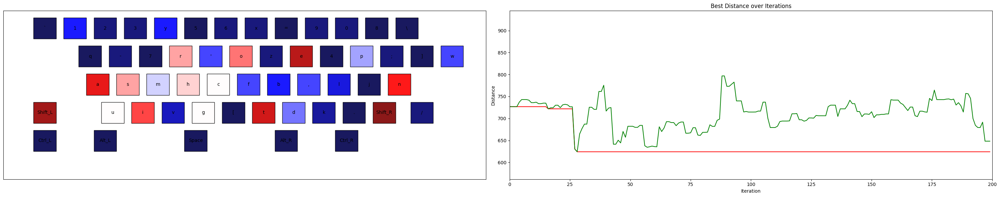

In [248]:
anim = qwert.visualise_kyb(NUM_ITERATIONS)
HTML(anim.to_jshtml())

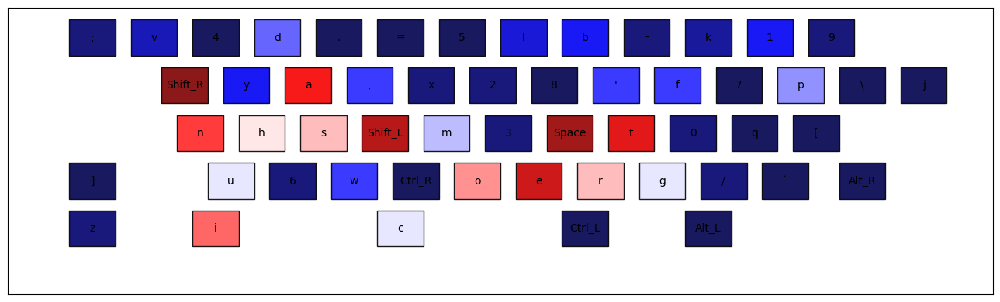

In [162]:
qwert.kybd_image(qwrty, best_layout)

In [ ]:
sample_long_string = """1In the beginning God created the heaven and the earth.

2And the earth was without form, and void; and darkness was upon the face of the deep. And the Spirit of God moved upon the face of the waters.

3And God said, Let there be light and there was light.

4And God saw the light, that it was good  and God divided the light from the darkness.

5And God called the light Day, and the darkness he called Night. And the evening and the morning were the first day.

6And God said, Let there be a firmament in the midst of the waters, and let it divide the waters from the waters.

7And God made the firmament, and divided the waters which were under the firmament from the waters which were above the firmament  and it was so.

8And God called the firmament Heaven. And the evening and the morning were the second day.

9And God said, Let the waters under the heaven be gathered together unto one place, and let the dry land appear  and it was so.

10And God called the dry land Earth; and the gathering together of the waters called he Seas  and God saw that it was good.

11And God said, Let the earth bring forth grass, the herb yielding seed, and the fruit tree yielding fruit after his kind, whose seed is in itself, upon the earth  and it was so.

12And the earth brought forth grass, and herb yielding seed after his kind, and the tree yielding fruit, whose seed was in itself, after his kind  and God saw that it was good.

13And the evening and the morning were the third day.

14And God said, Let there be lights in the firmament of the heaven to divide the day from the night; and let them be for signs, and for seasons, and for days, and years 

15And let them be for lights in the firmament of the heaven to give light upon the earth  and it was so.

16And God made two great lights; the greater light to rule the day, and the lesser light to rule the night  he made the stars also.

17And God set them in the firmament of the heaven to give light upon the earth,

18And to rule over the day and over the night, and to divide the light from the darkness  and God saw that it was good.

19And the evening and the morning were the fourth day.

20And God said, Let the waters bring forth abundantly the moving creature that hath life, and fowl that may fly above the earth in the open firmament of heaven.

21And God created great whales, and every living creature that moveth, which the waters brought forth abundantly, after their kind, and every winged fowl after his kind  and God saw that it was good.

22And God blessed them, saying, Be fruitful, and multiply, and fill the waters in the seas, and let fowl multiply in the earth.

23And the evening and the morning were the fifth day.

24And God said, Let the earth bring forth the living creature after his kind, cattle, and creeping thing, and beast of the earth after his kind  and it was so.

25And God made the beast of the earth after his kind, and cattle after their kind, and every thing that creepeth upon the earth after his kind  and God saw that it was good.

26And God said, Let us make man in our image, after our likeness  and let them have dominion over the fish of the sea, and over the fowl of the air, and over the cattle, and over all the earth, and over every creeping thing that creepeth upon the earth.

27So God created man in his own image, in the image of God created he him; male and female created he them.

28And God blessed them, and God said unto them, Be fruitful, and multiply, and replenish the earth, and subdue it  and have dominion over the fish of the sea, and over the fowl of the air, and over every living thing that moveth upon the earth.

29And God said, Behold, I have given you every herb bearing seed, which is upon the face of all the earth, and every tree, in the which is the fruit of a tree yielding seed; to you it shall be for meat.

30And to every beast of the earth, and to every fowl of the air, and to every thing that creepeth upon the earth, wherein there is life, I have given every green herb for meat  and it was so.

31And God saw every thing that he had made, and, behold, it was very good. And the evening and the morning were the sixth day."""

In [ ]:
qwert_new = kybd_optimise(qwrty)  # Testing for qwerty layout
qwerty_opt_layout_long = qwert_new.sim_anneal(
    sample_long_string, INITIAL_TEMP, COOLING_RATE, NUM_ITERATIONS
)

# anim = qwert.visualise_kyb(NUM_ITERATIONS)    #Uncomment these 2 lines if you want to view the animation
# HTML(anim.to_jshtml())

# qwert.kybd_image(qwrty,qwerty_opt_layout_long)  #Uncomment this line if you want to just view the final result

initial travel distance was 3040.7167036152755
After simulated annealing, minimum travel distance is 1870.7942748055953
There has been a 38.475219589470306% improvement
